# Исследование рынка заведений общественного питания г. Москвы

# Описание проекта
   Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.
   Для начала они просят вас — аналитика — подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.

   Вам доступен датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. Она носит исключительно справочный характер.
# Описание данных
Файл `moscow_places.csv`:
- name — название заведения;
- address — адрес заведения;
- category — категория заведения, например «кафе», «пиццерия» или «кофейня»;
- hours — информация о днях и часах работы;
- lat — широта географической точки, в которой находится заведение;
- lng — долгота географической точки, в которой находится заведение;
- rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
- price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
- avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:
    - «Средний счёт: 1000–1500 ₽»;
    - «Цена чашки капучино: 130–220 ₽»;
    - «Цена бокала пива: 400–600 ₽».
- middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:
    - Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
    - Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
    - Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.
- middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:
    - Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
    - Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
    - Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт. 
- chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):
        0 — заведение не является сетевым
        1 — заведение является сетевым
- district — административный район, в котором находится заведение, например Центральный административный округ;
- seats — количество посадочных мест.

## Загрузка данных и общая информация

In [2]:
import pandas as pd
from IPython.display import display 
import plotly.express as px
import seaborn as sns
import matplotlib.pyplot as plt
from plotly import graph_objects as go
import folium
from folium import Map, Choropleth, Marker
from folium.plugins import MarkerCluster
import json

In [3]:
# Отображение всех колонок таблиц
pd.set_option('display.max_columns', None)
# ширина колонок при выводе
pd.set_option('display.max_colwidth', 1000)

In [4]:
try:
    places = pd.read_csv('moscow_places.csv')
except:
    places = pd.read_csv('/datasets/moscow_places.csv')

In [5]:
display(places.head(10))
print('-'*50)
places.info()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0
5,Sergio Pizza,пиццерия,"Москва, Ижорская улица, вл8Б",Северный административный округ,"ежедневно, 10:00–23:00",55.888010,37.509573,4.6,средние,NaN,NaN,NaN,0,NaN
6,Огни города,"бар,паб","Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,пн 15:00–04:00; вт-вс 15:00–05:00,55.890752,37.524653,4.4,средние,Средний счёт:199 ₽,199.0,NaN,0,45.0
7,Mr. Уголёк,быстрое питание,"Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00–22:00",55.890636,37.524303,4.7,средние,Средний счёт:200–300 ₽,250.0,NaN,0,45.0
8,Donna Maria,ресторан,"Москва, Дмитровское шоссе, 107, корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.880045,37.539006,4.8,средние,Средний счёт:от 500 ₽,500.0,NaN,0,79.0
9,Готика,кафе,"Москва, Ангарская улица, 39",Северный административный округ,"ежедневно, 12:00–00:00",55.879038,37.524487,4.3,средние,Средний счёт:1000–1200 ₽,1100.0,NaN,0,65.0


--------------------------------------------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


In [6]:
places.isna().sum()

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

In [7]:
places.describe()

,lat,lng,rating,middle_avg_bill,middle_coffee_cup,chain,seats
count,8406.000000,8406.000000,8406.000000,3149.000000,535.000000,8406.000000,4795.000000
mean,55.750109,37.608570,4.229895,958.053668,174.721495,0.381275,108.421689
std,0.069658,0.098597,0.470348,1009.732845,88.951103,0.485729,122.833396
min,55.573942,37.355651,1.000000,0.000000,60.000000,0.000000,0.000000
25%,55.705155,37.538583,4.100000,375.000000,124.500000,0.000000,40.000000
50%,55.753425,37.605246,4.300000,750.000000,169.000000,0.000000,75.000000
75%,55.795041,37.664792,4.400000,1250.000000,225.000000,1.000000,140.000000
max,55.928943,37.874466,5.000000,35000.000000,1568.000000,1.000000,1288.000000


In [8]:
places.duplicated().sum()

0

**Вывод:**
- Датафрейм содердит в себе 14 колонок с 8405 записями;
- Имеются пропуски в 6 колонках;
- Имеются аномальные значения в колонке `middle_avg_bill` и `seats`;
- Явные дубликаты в датасете отсутвуют.

## Предобработка данных

In [9]:
#Приведем названия заведений к нижнему регистру
places['name'] = places['name'].str.lower() 

In [10]:
places['category'].unique()

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

In [11]:
places[places['hours'].isna() == True]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
38,ижора,булочная,"Москва, Ижорский проезд, 5А",Северный административный округ,NaN,55.888366,37.514856,4.4,NaN,NaN,NaN,NaN,0,NaN
40,кафе,кафе,"Москва, Ижорская улица, 18, стр. 1",Северный административный округ,NaN,55.895115,37.524902,3.7,NaN,NaN,NaN,NaN,0,NaN
44,кафетерий,кафе,"Москва, Ангарская улица, 24А",Северный административный округ,NaN,55.876289,37.519315,3.8,NaN,NaN,NaN,NaN,1,8.0
56,рыба из тандыра,быстрое питание,"Москва, Коровинское шоссе, 46, стр. 5",Северный административный округ,NaN,55.888010,37.515960,1.5,NaN,NaN,NaN,NaN,0,NaN
108,кафе,"бар,паб","Москва, МКАД, 82-й километр, вл18",Северо-Восточный административный округ,NaN,55.908930,37.558777,4.2,NaN,NaN,NaN,NaN,0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8236,1у,кафе,"Москва, Нагатинская набережная, 40/1к1",Южный административный округ,NaN,55.685528,37.673546,3.4,NaN,NaN,NaN,NaN,0,NaN
8375,улица гурьянова 55,кафе,"Москва, улица Гурьянова, 55",Юго-Восточный административный округ,NaN,55.679981,37.717034,4.5,NaN,NaN,NaN,NaN,0,NaN
8378,восточно-грузинская кухня,быстрое питание,"Москва, Зеленодольская улица, 32, корп. 3",Юго-Восточный административный округ,NaN,55.710540,37.767864,4.3,NaN,NaN,NaN,NaN,0,120.0
8381,аэлита,кафе,"Москва, Ферганская улица, 8, корп. 2, стр. 1",Юго-Восточный административный округ,NaN,55.708871,37.803831,3.8,NaN,NaN,NaN,NaN,0,30.0


In [12]:
places[['price', 'avg_bill', 'middle_avg_bill', 'middle_coffee_cup', 'seats']].sample(15)

,price,avg_bill,middle_avg_bill,middle_coffee_cup,seats
5206,NaN,NaN,NaN,NaN,295.0
6922,средние,Средний счёт:1000 ₽,1000.0,NaN,170.0
3497,NaN,Цена чашки капучино:90–100 ₽,NaN,95.0,NaN
2911,NaN,NaN,NaN,NaN,81.0
6503,NaN,NaN,NaN,NaN,NaN
2480,средние,Средний счёт:150–300 ₽,225.0,NaN,350.0
7356,NaN,NaN,NaN,NaN,154.0
4605,средние,Средний счёт:250–300 ₽,275.0,NaN,40.0
7249,NaN,Средний счёт:250–400 ₽,325.0,NaN,350.0
3222,высокие,Средний счёт:2500–3500 ₽,3000.0,NaN,98.0


Заполнить столбцы с пропусками корректно невозможно, т.к. столбцы `middle_avg_bill`, `middle_coffee_cup` и `price` зависят от столбца `avg_bill`, елси данный столбец пуст, заполнить остальные нет возвомжности. Столбцы `seats` и `hours` не от чего не зависящие столбцы, их тоже заполнить невозможно.

In [13]:
places['street'] = places['address'].str.extract(pat = ',(.*?),')
places['street'] = places['street'].str.strip()
places['street'].sample(10)

7082    Юго-Западный административный округ
4746                      Докучаев переулок
7249                        Каширское шоссе
3277                       Береговой проезд
6641                   проспект Вернадского
4853              Верхняя Радищевская улица
4302                      улица Новый Арбат
2604                     7-я Парковая улица
380                           улица Свободы
1362                    Ленинградское шоссе
Name: street, dtype: object

In [14]:
places['is_24/7'] = places['hours'].apply(lambda x: x == 'ежедневно, круглосуточно')
places[['hours', 'is_24/7']].sample(10)

,hours,is_24/7
4177,"ежедневно, 08:30–20:00",False
6054,"пн-пт 09:00–23:00; сб,вс 12:00–23:00",False
5688,пн 12:00–02:00; вт-вс 11:30–02:00,False
874,"ежедневно, 09:00–21:00",False
3591,"ежедневно, 09:00–23:00",False
1992,пн-пт 09:00–18:00,False
7269,"ежедневно, 09:00–05:00",False
7292,"ежедневно, 10:00–23:00",False
5632,"пн-пт 10:00–22:00; сб,вс 10:00–23:00",False
1153,"ежедневно, 07:00–02:00",False


**Вывод:**
- Названия заведений приведены к нижнему регистру;
- В датафрейм добавлены столбцы `strees` и `is_24/7`;
- Пропуски заполнить не удалось;
- датафрейм состоит из 16 столбцов и 8405 записей.

## Анализ данных

### Категории заведений

In [15]:
category_cnt = places['category'].value_counts().reset_index()
category_cnt.columns = ['category','count']
category_cnt = category_cnt.sort_values(by='count', ascending=False)
category_cnt

,category,count
0,кафе,2378
1,ресторан,2043
2,кофейня,1413
3,"бар,паб",765
4,пиццерия,633
5,быстрое питание,603
6,столовая,315
7,булочная,256


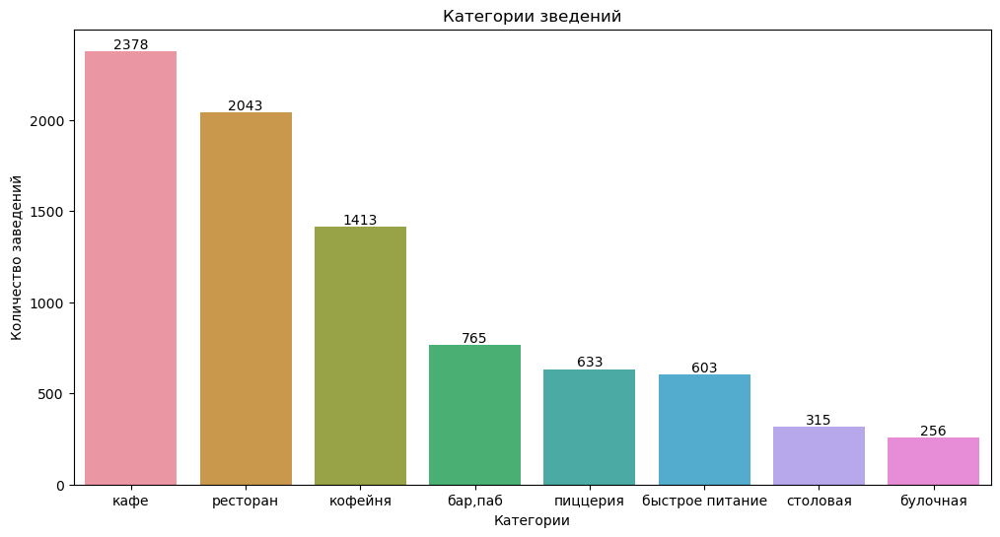

In [16]:
plt.figure(figsize=(12, 6))
with plt.style.context('seaborn-pastel'):
    ax = sns.barplot(x='category', y='count', data=category_cnt, order=category_cnt.sort_values('count', ascending = False).category)
    ax.set_title('Категории зведений')
    ax.set_xlabel('Категории')
    ax.set_ylabel('Количество заведений')

for i, val in enumerate(category_cnt['count'].values):
    plt.text(i, val+15, int(val), horizontalalignment='center')
plt.show()

**Вывод:**

Всего 8 категорий на которые делятся заведения. Больше всего заведений типа "Кафе", на втором месте "Ресторан", на третьем - "Кофейня". Меньше всего заведений типа "Столовая" и "Булочная".

### Количество посадочных мест по категориям заведений

In [17]:
seats_by_category = places.pivot_table(index = 'category', values = 'seats', aggfunc = 'median').sort_values(by = 'seats', ascending = False).reset_index()
seats_by_category.columns = ['category', 'seats_median']
seats_by_category

,category,seats_median
0,ресторан,86.0
1,"бар,паб",82.5
2,кофейня,80.0
3,столовая,75.5
4,быстрое питание,65.0
5,кафе,60.0
6,пиццерия,55.0
7,булочная,50.0


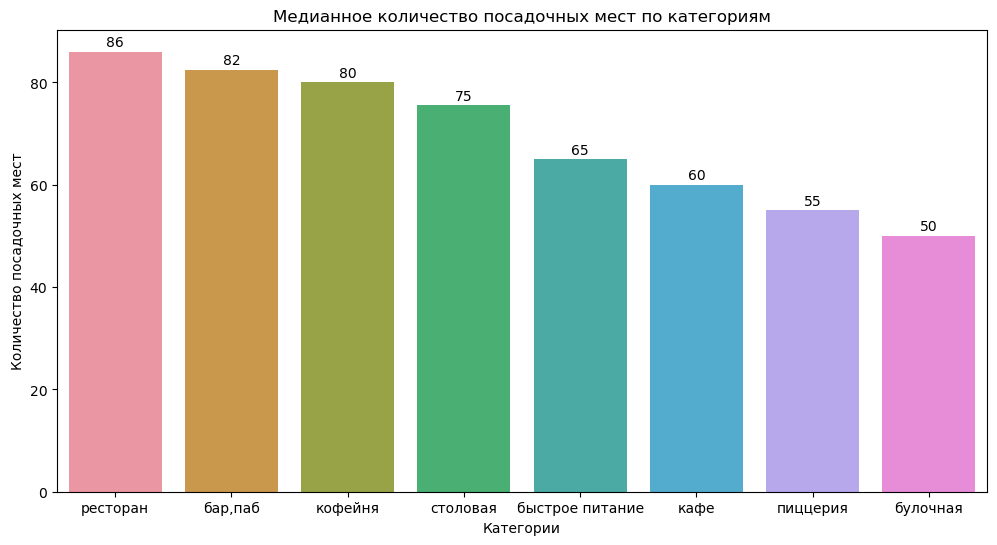

In [18]:
plt.figure(figsize=(12, 6))
with plt.style.context('seaborn-pastel'):
    ax = sns.barplot(x='category', y='seats_median', data=seats_by_category)
    ax.set_title('Медианное количество посадочных мест по категориям')
    ax.set_xlabel('Категории')
    ax.set_ylabel('Количество посадочных мест')
    
for i, val in enumerate(seats_by_category['seats_median'].values):
    plt.text(i, val+1, int(val), horizontalalignment='center')
    
plt.show()

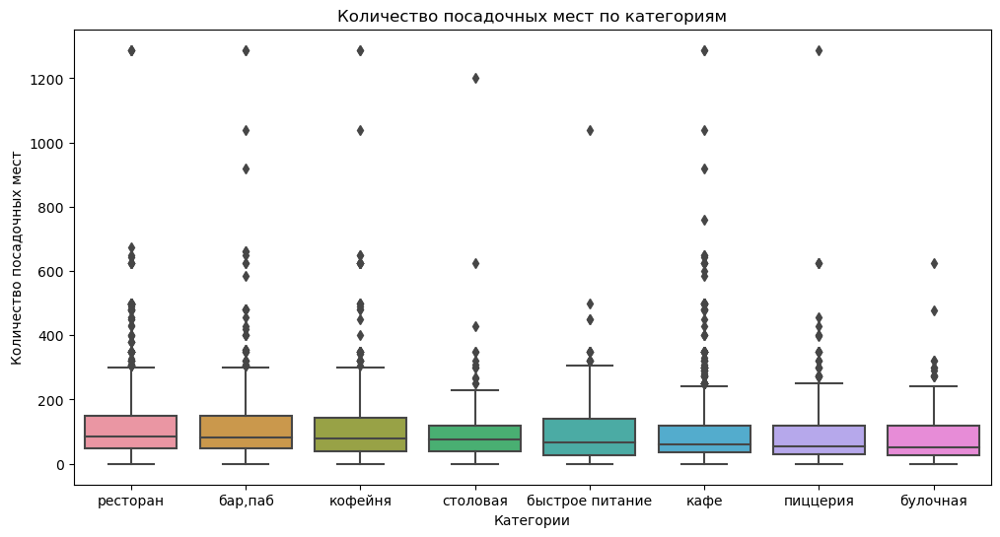

In [19]:
plt.figure(figsize=(12, 6))
with plt.style.context('seaborn-pastel'):
    ax = sns.boxplot(x='category', y='seats', data=places, order=seats_by_category['category'])
    ax.set_title('Количество посадочных мест по категориям')
    ax.set_xlabel('Категории')
    ax.set_ylabel('Количество посадочных мест') 

   
plt.show()

**Вывод:**

В каждой категории заведений имеются выбросы по посадочным местам. По медианному значению количества посадочных мест, больше всего мест в ресторанах, барах и пабах. Меньше всего в пиццериях и булочных.

### Количество сетевых и несетевых заведений

In [20]:
plt.figure(figsize=(12, 6))
fig = go.Figure(
    data=[go.Pie(labels=places['chain'].value_counts().reset_index(), values=places['chain'].value_counts())],
)
    
fig.update_layout(
            title={
            'text' : 'Соотношение сетевых и несетевых заведений',
            'x':0.5,
            'xanchor': 'center'
        })
for trace in fig.data:
    trace['labels'] = ['Несетевые', 'Сетевые'] 
fig.show()

<Figure size 1200x600 with 0 Axes>

**Вывод:**

Количество несетевых заведений преобладает почти в 2 раза над сетевыми

### Сетевый заведения по категориям

In [21]:
category_chain = places.groupby(['category','chain'], as_index = False).agg({'name':'count'}).sort_values(by = 'name', ascending = False)

category_chain

,category,chain,name
6,кафе,0,1599
12,ресторан,0,1313
7,кафе,1,779
13,ресторан,1,730
9,кофейня,1,720
8,кофейня,0,693
0,"бар,паб",0,596
4,быстрое питание,0,371
11,пиццерия,1,330
10,пиццерия,0,303


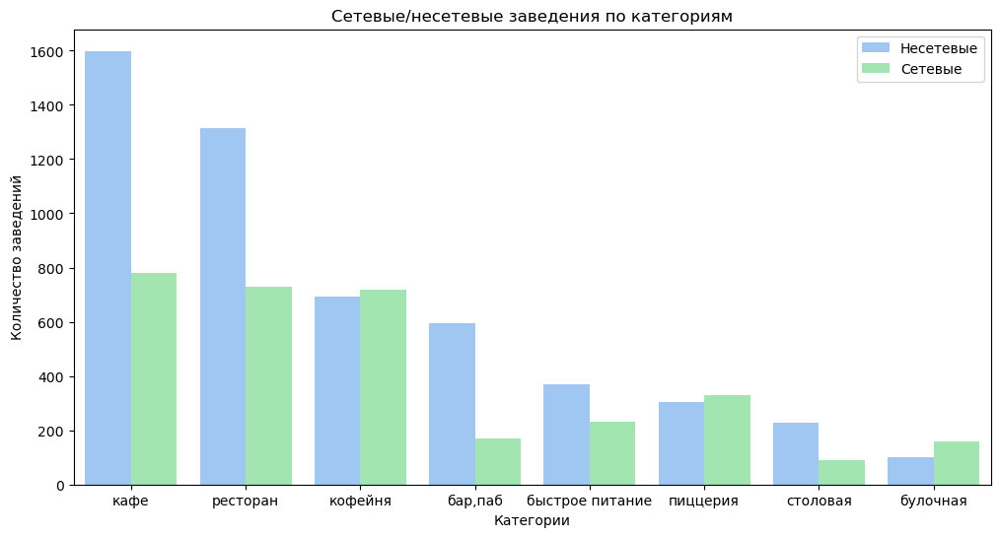

In [22]:
plt.figure(figsize=(12, 6))
with plt.style.context('seaborn-pastel'):
    ax = sns.barplot(x='category', y='name', hue='chain', data=category_chain)
    ax.set_title('Сетевые/несетевые заведения по категориям')
    ax.set_xlabel('Категории')
    ax.set_ylabel('Количество заведений')
    h, l = ax.get_legend_handles_labels()
    ax.legend(h, ['Несетевые', 'Сетевые'])
    
    
plt.show()

**Вывод:**

Больше всего сетевых заведий в категории кафе и ресторан. В категории Булочная меньше всего сетевых заведений.

In [23]:
category_chain_1 = places[places['chain'] == 1].pivot_table(index='category', values='name', aggfunc='count').sort_values(by='name', ascending=False).reset_index()
cnt_category = places.pivot_table(index='category', values='name', aggfunc='count').reset_index()
category_chain_1 = category_chain_1.merge(cnt_category, how='inner', on='category')
category_chain_1.columns = ['category', 'chain_1', 'all']
category_chain_1['persent'] = round(category_chain_1['chain_1'] / category_chain_1['all'] * 100, 2)
category_chain_1 = category_chain_1.sort_values(by='persent', ascending=False)
category_chain_1

,category,chain_1,all,persent
6,булочная,157,256,61.33
3,пиццерия,330,633,52.13
2,кофейня,720,1413,50.96
4,быстрое питание,232,603,38.47
1,ресторан,730,2043,35.73
0,кафе,779,2378,32.76
7,столовая,88,315,27.94
5,"бар,паб",169,765,22.09


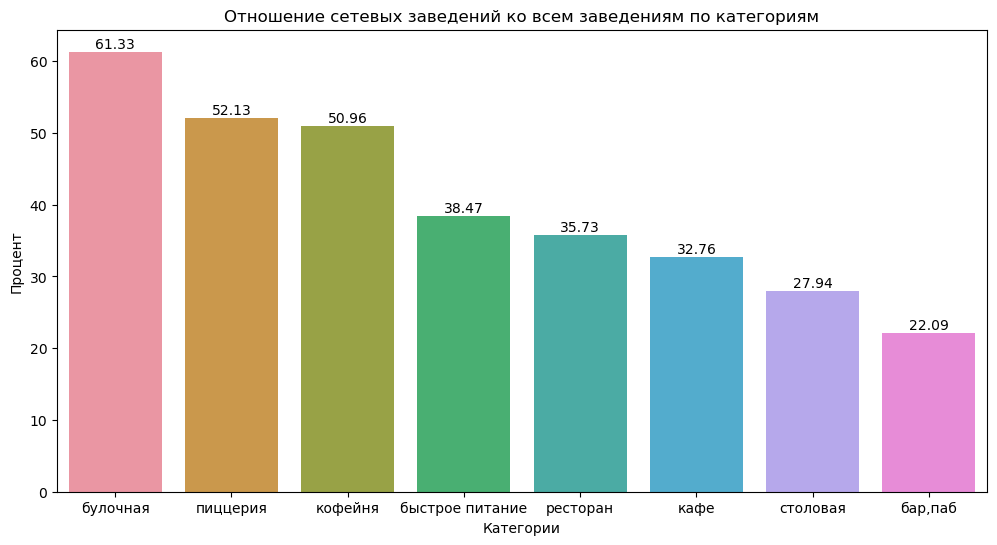

In [24]:
plt.figure(figsize=(12, 6))
with plt.style.context('seaborn-pastel'):
    ax = sns.barplot(x='category', y='persent', data=category_chain_1, order=category_chain_1['category'])
    ax.set_title('Отношение сетевых заведений ко всем заведениям по категориям')
    ax.set_xlabel('Категории')
    ax.set_ylabel('Процент')
    
for i, val in enumerate(category_chain_1['persent'].values):
    plt.text(i, val+0.5, float(val), horizontalalignment='center')
    
    
plt.show()

**Вывод:**

Более 60% из всех "Булочных" являются сетевыми. Чуть больше ~50% всех пиццерий и кофеен сетевый. Меньше всего "Бар, паб" заведний - сетевые ~22%.

### ТОП-15 Московских заведений

In [25]:
top_15 = places[places['chain'] == True].pivot_table(index = ['category', 'name'], values = 'chain', aggfunc = 'count')\
         .sort_values(by = 'chain', ascending = False).reset_index().head(15)
top_15.columns = ['category', 'name', 'count']
top_15

,category,name,count
0,кофейня,шоколадница,119
1,пиццерия,домино'с пицца,76
2,пиццерия,додо пицца,74
3,кофейня,one price coffee,71
4,ресторан,яндекс лавка,69
5,кофейня,cofix,65
6,ресторан,prime,49
7,кофейня,кофепорт,42
8,кафе,кулинарная лавка братьев караваевых,39
9,ресторан,теремок,36


In [26]:
fig = px.sunburst(top_15, path = ['category', 'name'], values  = 'count', hover_data = ['count'])
fig.update_layout(title_text = 'Топ-15 популярных сетей в Москве и их категории', title_x = 0.5)
                 
fig.show()

In [27]:
top_category = top_15.pivot_table(index='category', values='count', aggfunc='sum').reset_index()
top_category['percent'] = round(top_category['count'] / sum(top_category['count']) * 100, 2)
top_category = top_category.sort_values(by='percent', ascending=False)
top_category

,category,count,percent
2,кофейня,350,45.57
4,ресторан,154,20.05
3,пиццерия,150,19.53
1,кафе,89,11.59
0,булочная,25,3.26


**Вывод:**

Больше всего сетевых заведений категории кофейня ~ 45,57% от общего количества сетевых заведений. "Шоколадница" самая большая сеть этой категории.
Рестораны составляют ~ 20% от всех заведений. Самая популярная сеть в этом сегменте "Яндекс Лавка"
~ 3,26% составляет категория булочная, здесь одна сеть - "Буханка".

### Категории заведений по районам 

In [28]:
places['district'].unique()

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

In [29]:
places['district_abbr'] = places['district'].replace(
    {'Северный административный округ': 'САО',
     'Северо-Восточный административный округ': 'СВАО',
     'Северо-Западный административный округ': 'СЗАО',
     'Западный административный округ': 'ЗАО',
     'Центральный административный округ': 'ЦАО',
     'Восточный административный округ': 'ВАО',
     'Юго-Восточный административный округ': 'ЮВАО',
     'Южный административный округ': 'ЮАО',
     'Юго-Западный административный округ': 'ЮЗАО'}
    )
distr_category = places.groupby(['district_abbr', 'category'], as_index=False)['name'].count().reset_index()
distr_category = distr_category.sort_values(by='name', ascending=False)
distr_category

,index,district_abbr,category,name
46,46,ЦАО,ресторан,670
43,43,ЦАО,кафе,464
44,44,ЦАО,кофейня,428
40,40,ЦАО,"бар,паб",364
59,59,ЮВАО,кафе,282
...,...,...,...,...
32,32,СЗАО,"бар,паб",23
39,39,СЗАО,столовая,18
71,71,ЮЗАО,столовая,17
57,57,ЮВАО,булочная,13


In [30]:
fig = px.bar(distr_category, x = 'district_abbr', y = 'name',
             color = 'category',
             text = 'name', 
             labels={
                     "name": "Количество заведений",
                     "district_abbr": "Название административного округа",
                     "category": "Категория"}
            )
fig.update_layout(title_text = 'Количество заведений каждой категории по округам', title_x = 0.5)
fig.show()

**Вывод:**

В каждом округе преобладают заведения типа ресторана и кафе. Больше всего заведений в ЦАО (более 2000). Меньше всего заведений в Северно-Западном округе.

### Средний рейтинг заведений по категориям

In [31]:
rating_category = places.pivot_table(index='category', values='rating', aggfunc='mean').sort_values(by='rating', ascending = False).reset_index()
rating_category['rating'] = round(rating_category['rating'], 2)

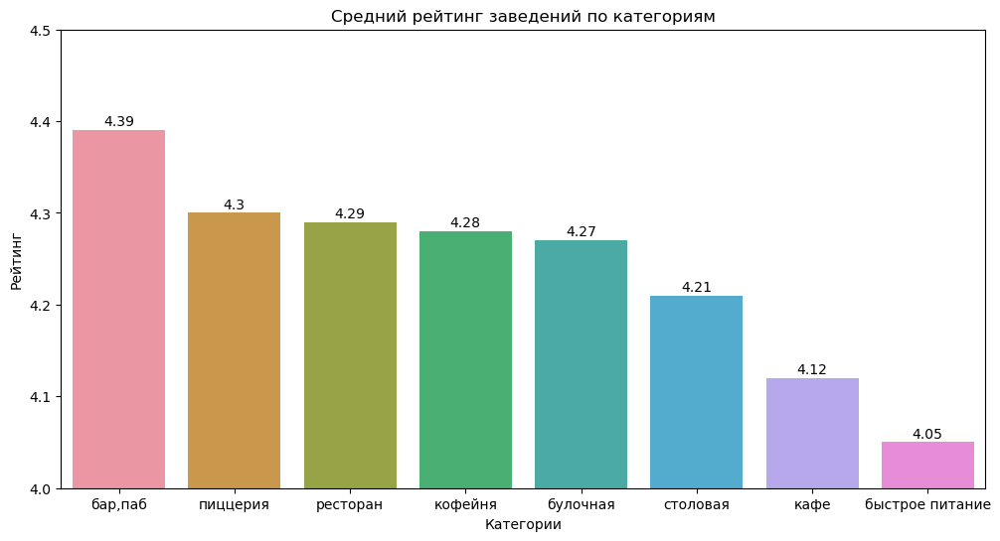

In [32]:
plt.figure(figsize=(12, 6))
with plt.style.context('seaborn-pastel'):
    ax = sns.barplot(x='category', y='rating', data=rating_category)
    ax.set_title('Средний рейтинг заведений по категориям')
    ax.set_xlabel('Категории')
    ax.set_ylabel('Рейтинг')
    ax.set_ylim(4, 4.5) 

for i, val in enumerate(rating_category['rating'].values):
    plt.text(i, val+0.005, float(val), horizontalalignment='center')
    
plt.show()

**Вывод:**
    
Средний рейтинг заведений по категориям почти не отличается и находится в промежутке от ~4.05 до ~4.4. Рейтинг выше у заведений категории бара/паб и пиццерия, ниже рейтинг у заведений быстрого питания

### Хороплет со средним рейтингом заведений по районам

In [33]:
rating_district = places.pivot_table(index='district', values='rating', aggfunc='mean').sort_values(by='rating', ascending=False).reset_index()
rating_district['rating'] = round(rating_district['rating'], 2)
rating_district

,district,rating
0,Центральный административный округ,4.38
1,Северный административный округ,4.24
2,Северо-Западный административный округ,4.21
3,Южный административный округ,4.18
4,Западный административный округ,4.18
5,Восточный административный округ,4.17
6,Юго-Западный административный округ,4.17
7,Северо-Восточный административный округ,4.15
8,Юго-Восточный административный округ,4.10


In [34]:
# загружаем JSON-файл с границами округов Москвы
state_geo = 'https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson'

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
choropleth = folium.Choropleth(
    geo_data = state_geo,
    data = rating_district,
    columns = ['district', 'rating'],
    key_on = 'feature.name',
    fill_color = 'YlGn',
    fill_opacity = 0.5,
    legend_name = 'Средний рейтинг заведений по районам',
).add_to(m)

choropleth.geojson.add_child(
    folium.features.GeoJsonTooltip(fields = ['name'], aliases = ['Район:'],
                                   labels  =True, localize = True, sticky = False))

# выводим карту
m 

In [35]:
rating_district_abbr = places.pivot_table(index='district_abbr', values='rating', aggfunc='mean').sort_values(by='rating', ascending=False).reset_index()
rating_district_abbr['rating'] = round(rating_district_abbr['rating'], 2)
rating_district_abbr

,district_abbr,rating
0,ЦАО,4.38
1,САО,4.24
2,СЗАО,4.21
3,ЮАО,4.18
4,ЗАО,4.18
5,ВАО,4.17
6,ЮЗАО,4.17
7,СВАО,4.15
8,ЮВАО,4.10


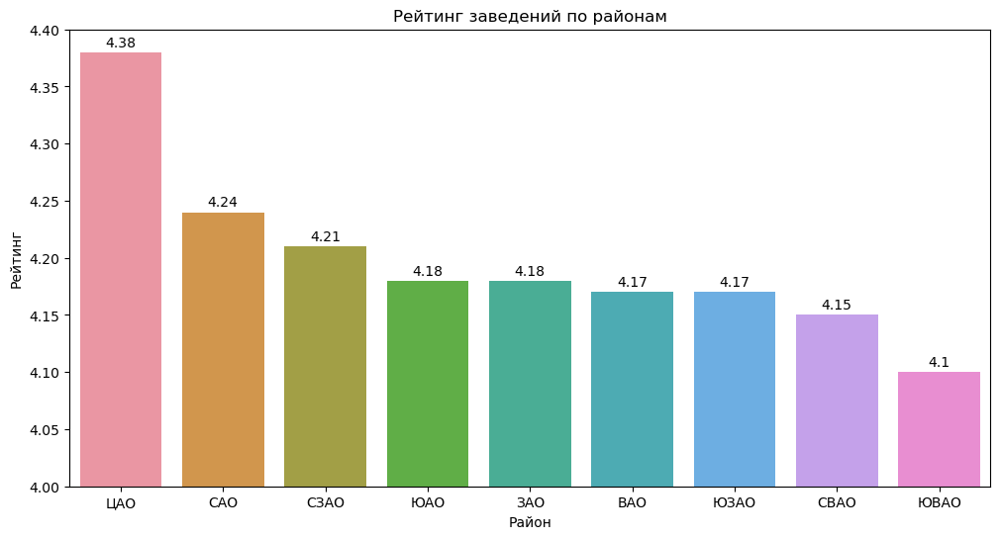

In [36]:
plt.figure(figsize=(12, 6))
with plt.style.context('seaborn-pastel'):
    ax = sns.barplot(x='district_abbr', y='rating', data=rating_district_abbr)
    ax.set_title('Рейтинг заведений по районам')
    ax.set_xlabel('Район')
    ax.set_ylabel('Рейтинг')
    ax.set_ylim(4, 4.4)    

for i, val in enumerate(rating_district_abbr['rating'].values):
    plt.text(i, val+0.005, float(val), horizontalalignment='center')

plt.show()

**Вывод:**

Средние рейтинги по районам различаются не сильно, все они в промежутке от 4.1 до 4.4. Выше всего вредний рейтинг в Центральном районе Москвы, самый низкий в Юго-Восточном районе.

### Хороплет с заведениями Москвы

In [37]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

#создаем пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

#пишем фукнцию, которая принимает строку датафрейма,
# создает маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
          popup=f"{row['name']} {row['rating']}",
          ).add_to(marker_cluster)

places.apply(create_clusters, axis=1)
# выводим карту
m 

### ТОП-15 улиц по кличеству заведений 

In [38]:
street_top = places.pivot_table(index='street', values='name', aggfunc='count').sort_values(by='name', ascending=False).reset_index().head(15)
street_top.columns = ['street', 'count']
street_top

,street,count
0,проспект Мира,184
1,Профсоюзная улица,122
2,проспект Вернадского,108
3,Ленинский проспект,107
4,Ленинградский проспект,95
5,Дмитровское шоссе,88
6,Каширское шоссе,77
7,Варшавское шоссе,75
8,Ленинградское шоссе,69
9,МКАД,65


In [39]:
category_strett = places.groupby(['street', 'category'], as_index=False)['name'].count().sort_values(by='name', ascending=False)
category_strett.columns = ['street', 'category', 'count']
category_strett

,street,category,count
2789,проспект Мира,кафе,53
1358,МКАД,кафе,45
2792,проспект Мира,ресторан,45
2790,проспект Мира,кофейня,36
1963,Профсоюзная улица,кафе,35
...,...,...,...
845,Дендропарковая улица,кафе,1
846,Денежный переулок,ресторан,1
2178,Снежная улица,быстрое питание,1
2177,Снайперская улица,ресторан,1


In [40]:
street_top_category = category_strett.merge(street_top, how='inner', on='street')
street_top_category

,street,category,count_x,count_y
0,проспект Мира,кафе,53,184
1,проспект Мира,ресторан,45,184
2,проспект Мира,кофейня,36,184
3,проспект Мира,быстрое питание,21,184
4,проспект Мира,"бар,паб",12,184
...,...,...,...,...
106,улица Вавилова,быстрое питание,11,55
107,улица Вавилова,кофейня,10,55
108,улица Вавилова,пиццерия,3,55
109,улица Вавилова,"бар,паб",2,55


In [41]:
street_top_category['percent'] = round(street_top_category['count_x'] / street_top_category['count_y'] * 100, 2)
street_top_category.columns = ['street', 'category', 'count', 'count_street', 'percent']
street_top_category = street_top_category.sort_values(by = 'count_street', ascending = False)
street_top_category.head(20)

,street,category,count,count_street,percent
0,проспект Мира,кафе,53,184,28.80
2,проспект Мира,кофейня,36,184,19.57
3,проспект Мира,быстрое питание,21,184,11.41
4,проспект Мира,"бар,паб",12,184,6.52
5,проспект Мира,пиццерия,11,184,5.98
6,проспект Мира,булочная,4,184,2.17
7,проспект Мира,столовая,2,184,1.09
1,проспект Мира,ресторан,45,184,24.46
15,Профсоюзная улица,ресторан,26,122,21.31
21,Профсоюзная улица,столовая,3,122,2.46


In [42]:
fig = px.bar(street_top_category, 
             x = 'street', 
             y = 'count', 
             color = 'category', 
             text = 'percent',
             labels={
                 "count": "Количество заведений",
                 "street": "Название улицы",
                 "category": "Категория"},
             )
fig.update_layout(title_text = 'Рапределение категорий заведений по ТОП-15 улицам', title_x = 0.5)
fig.update_traces(textfont_size = 10, textangle = 0)

fig.show() 

**Вывод:**

По количеству заведений лидирует улица Мира - 184 заведения. В топе по категориям рестораны, кафе и кофейни. 

### Улица на которых 1 объект общепита

In [43]:
one_street = places.groupby(['street'])['name'].nunique()
one_street

street
1-й Автозаводский проезд     1
1-й Балтийский переулок      1
1-й Варшавский проезд        1
1-й Вешняковский проезд      1
1-й Волоколамский проезд     3
                            ..
улица Юннатов                1
улица Юности                 3
улица Юных Ленинцев         15
улица Яблочкова              3
шоссе Энтузиастов           31
Name: name, Length: 1393, dtype: int64

**Вывод:**

На улицах с одним заведением, много названий "проезд", "переулок". Значит это короткие улицы.

In [44]:
one_street_cafe = places.pivot_table(index=['district_abbr', 'street'], values='name', aggfunc='count').sort_values(by='name').reset_index()
one_street_cafe.columns = ['districy_abbr', 'street', 'cnt']
one_street_cafe = one_street_cafe[one_street_cafe['cnt'] == 1]
one_street_cafe

,districy_abbr,street,cnt
0,ВАО,1-й Кирпичный переулок,1
1,ЦАО,Малый Ивановский переулок,1
2,САО,улица 800-летия Москвы,1
3,САО,улица 8 Марта,1
4,ЦАО,Малый Казённый переулок,1
...,...,...,...
435,ЮАО,Дендропарковая улица,1
436,ЗАО,Барвихинская улица,1
437,ЗАО,улица Генерала Ермолова,1
438,ЮАО,2-й Верхний Михайловский проезд,1


In [45]:
distr_one_street_cafe = one_street_cafe['districy_abbr'].value_counts().reset_index()
distr_one_street_cafe

,districy_abbr,count
0,ЦАО,140
1,ВАО,50
2,СВАО,50
3,САО,48
4,ЮАО,44
5,ЮВАО,37
6,ЗАО,34
7,СЗАО,20
8,ЮЗАО,17


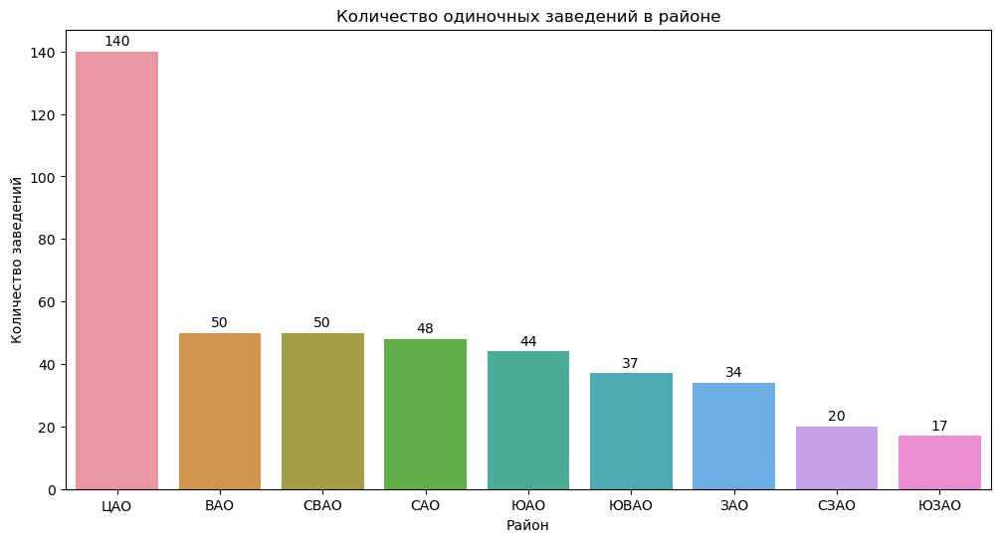

In [46]:
plt.figure(figsize=(12, 6))
with plt.style.context('seaborn-pastel'):
    ax = sns.countplot(x = 'districy_abbr',  data = one_street_cafe, order=distr_one_street_cafe['districy_abbr'])
    ax.set_title('Количество одиночных заведений в районе')
    ax.set_xlabel('Район')
    ax.set_ylabel('Количество заведений')
 
for i, val in enumerate(distr_one_street_cafe['count'].values):
    plt.text(i, val+2, int(val), horizontalalignment='center')

    
plt.show()

**Вывод:**

Больше всего одиночных заведений в Центральном районе Москвы. Меньше всего в Юго-Восточном районе.

### Хороплет со средними чеками по округам

In [47]:
district_middle_price = places.pivot_table(index='district', values='middle_avg_bill', aggfunc='median').reset_index()
district_middle_price

,district,middle_avg_bill
0,Восточный административный округ,575.0
1,Западный административный округ,1000.0
2,Северный административный округ,650.0
3,Северо-Восточный административный округ,500.0
4,Северо-Западный административный округ,700.0
5,Центральный административный округ,1000.0
6,Юго-Восточный административный округ,450.0
7,Юго-Западный административный округ,600.0
8,Южный административный округ,500.0


In [48]:
# загружаем JSON-файл с границами округов Москвы
state_geo = 'https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson'

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
choropleth = folium.Choropleth(
    geo_data = state_geo,
    data = district_middle_price,
    columns = ['district', 'middle_avg_bill'],
    key_on = 'feature.name',
    fill_color = 'YlGn',
    fill_opacity = 0.5,
    legend_name = 'Средний чек по районам',
).add_to(m)

choropleth.geojson.add_child(
    folium.features.GeoJsonTooltip(fields = ['name'], aliases = ['Район:'],
                                   labels  =True, localize = True, sticky = False))

# выводим карту
m 

**Вывод:**

Самый высокий средний чек имеют ЦАО и ЗАО. Наименьший средний чек имеют районы ЮАО, ЮВАО, СВАО.

### Общий вывод по анализу
1. В датафрейме собрана информация о 8 категориях заведений. Больше всего заведений типа "Кафе", "Рестоарн" и "Кофейня"
2. Количество посадочных мест преобладает в категориях "Ресторан" и "Бар, паб"
3. Количество несетевых заведений почти в два раза больше, чем сетевых
4. "Булочные", "Пиццерии" и "Кофейни" в более 50% случаи являются сетевыми. Меньше всего "Бар, паб" являются сетевыми ~22%
5. В ТОП популярных заведений Москвы вошли кофейня "Шоколадница", пиццерия "Домино'с пицца" и пиццерия	"Додо пицца"
6. В каждом округе преобладают заведения типа ресторана и кафе. Больше всего заведений в ЦАО (более 2000). Меньше всего заведений в Северно-Западном округе
7. Средний рейтинг выше у заведений категории "бар,паб" и "пиццерия"
8. Средний рейтинг по округам выше в ЦАО
9. Больше всего заведений находится на улице проспект Мира. Преобладают категории "Кафе" и "Ресторан"
10. Больше всего улиц с одним заведением в ЦАО. Большенство таких улиц очень короткие (проезд, переулок и т.д.)
11. Самый высокий средний чек имеют ЦАО и ЗАО. Наименьший средний чек имеют районы ЮАО, ЮВАО, СВАО

## Детализируем исследование: открытие кофейни

### Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?

In [49]:
coffee_house = places[places['category'] == 'кофейня'].pivot_table(index='district', values='name', aggfunc='count').sort_values(by='name', ascending=False).reset_index()
coffee_house.columns = ['district', 'cnt']
print('Всего кофеен в Москве:', coffee_house['cnt'].sum())
coffee_house

Всего кофеен в Москве: 1413


,district,cnt
0,Центральный административный округ,428
1,Северный административный округ,193
2,Северо-Восточный административный округ,159
3,Западный административный округ,150
4,Южный административный округ,131
5,Восточный административный округ,105
6,Юго-Западный административный округ,96
7,Юго-Восточный административный округ,89
8,Северо-Западный административный округ,62


In [50]:
# загружаем JSON-файл с границами округов Москвы
state_geo = 'https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson'

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
choropleth = folium.Choropleth(
    geo_data = state_geo,
    data = coffee_house,
    columns = ['district', 'cnt'],
    key_on = 'feature.name',
    fill_color = 'YlGn',
    fill_opacity = 0.5,
    legend_name = 'Количество заведений по районам',
).add_to(m)

choropleth.geojson.add_child(
    folium.features.GeoJsonTooltip(fields = ['name'], aliases = ['Район:'], labels =True, localize = True, sticky = False)
)

# выводим карту
m 

**Вывод:**

Больше всего кофеен расположено в ЦАО, меньше всего в СЗАО.

### Есть ли круглосуточные кофейни?

In [51]:
print('Количество кофеен, работающих круглосуточно:', places[((places['category'] == 'кофейня') &\
                                                             (places['is_24/7']==True))]['name'].count())

Количество кофеен, работающих круглосуточно: 59


### Какие у кофеен рейтинги? Как они распределяются по районам?

In [52]:
coffe_house_rating = places[places['category'] == 'кофейня'].pivot_table(index='district_abbr', values='rating', aggfunc='mean')\
.sort_values(by='rating', ascending=False).reset_index()
coffe_house_rating['rating'] = round(coffe_house_rating['rating'], 2)
coffe_house_rating

,district_abbr,rating
0,ЦАО,4.34
1,СЗАО,4.33
2,САО,4.29
3,ЮЗАО,4.28
4,ВАО,4.28
5,ЮАО,4.23
6,ЮВАО,4.23
7,СВАО,4.22
8,ЗАО,4.20


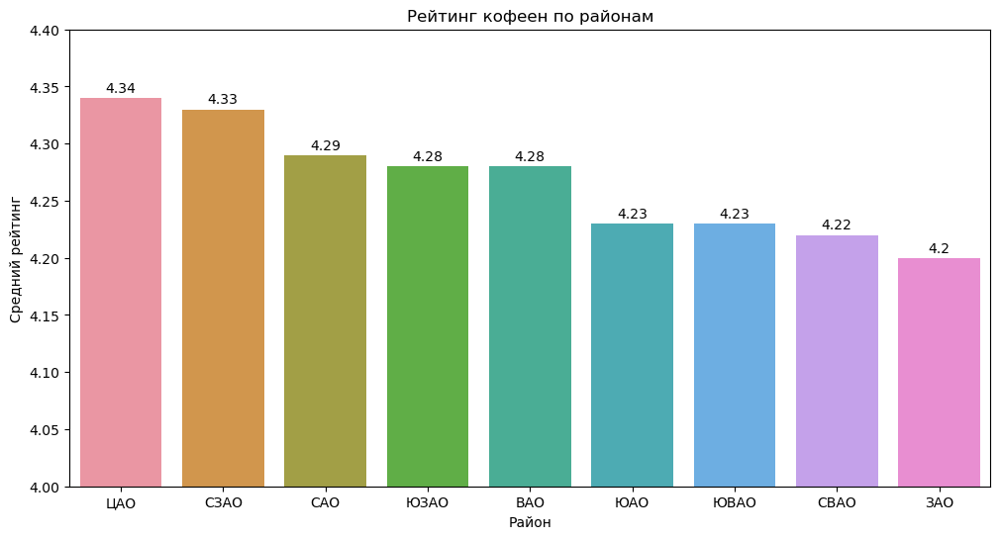

In [53]:
plt.figure(figsize=(12, 6))
with plt.style.context('seaborn-pastel'):
    ax = sns.barplot(x='district_abbr', y='rating', data=coffe_house_rating)
    ax.set_title('Рейтинг кофеен по районам')
    ax.set_xlabel('Район')
    ax.set_ylabel('Средний рейтинг')

ax.set_ylim(4, 4.4)    

for i, val in enumerate(coffe_house_rating['rating'].values):
    plt.text(i, val+0.005, float(val), horizontalalignment='center')    
    
plt.show()

**Вывод:**

Выше всего рейтинг кофеен в центральном районе Москвы ~4.34. НИже всего в ЗАО ~4.2

### На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?

In [54]:
coffe_house_cup = places[places['category'] == 'кофейня'].pivot_table(index='district_abbr', \
                                                                         values='middle_coffee_cup', aggfunc='mean')\
.sort_values(by='middle_coffee_cup', ascending=False).reset_index()
coffe_house_cup['middle_coffee_cup'] = round(coffe_house_cup['middle_coffee_cup'], 2)

coffe_house_cup

,district_abbr,middle_coffee_cup
0,ЗАО,189.94
1,ЦАО,187.52
2,ЮЗАО,184.18
3,ВАО,174.02
4,САО,165.79
5,СЗАО,165.52
6,СВАО,165.33
7,ЮАО,158.49
8,ЮВАО,151.09


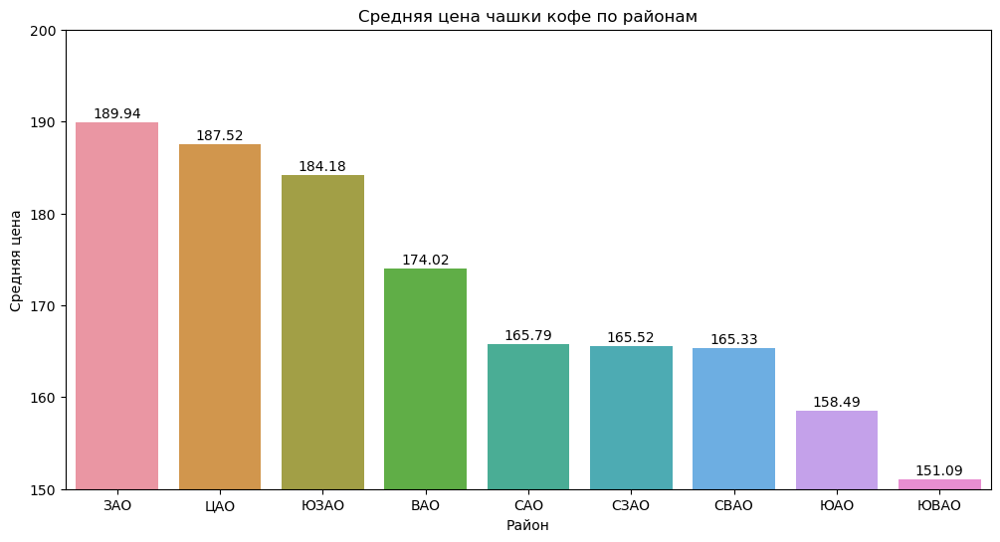

In [55]:
plt.figure(figsize=(12, 6))
with plt.style.context('seaborn-pastel'):
    ax = sns.barplot(x='district_abbr', y='middle_coffee_cup', data=coffe_house_cup)
    ax.set_title('Cредняя цена чашки кофе по районам')
    ax.set_xlabel('Район')
    ax.set_ylabel('Средняя цена')
    ax.set_ylim(150, 200)    

for i, val in enumerate(coffe_house_cup['middle_coffee_cup'].values):
    plt.text(i, val+0.5, float(val), horizontalalignment='center')    
    
plt.show()

### Доп. исследование

In [56]:
coffee = places[(places['category'] == 'кофейня') & (places['district_abbr'] == 'ЗАО')]
print("Стат. данные о чашке кофе\n\n", coffee['middle_coffee_cup'].describe())
print('-' * 50, "\nСтат.данные о посадочных местах")
coffee['seats'].describe()

Стат. данные о чашке кофе

 count     49.000000
mean     189.938776
std       74.227243
min       60.000000
25%      130.000000
50%      189.000000
75%      256.000000
max      300.000000
Name: middle_coffee_cup, dtype: float64
-------------------------------------------------- 
Стат.данные о посадочных местах


count      91.000000
mean      153.329670
std       205.286091
min         3.000000
25%        50.000000
50%        96.000000
75%       180.000000
max      1288.000000
Name: seats, dtype: float64

**Вывод:**

В ЗАО и ЦАО самые высокие средние цены за чашку кофе ~187-189 д.е. В ЮВАО самая низкая средняя цена за чашку кофе ~151 д.е.

### Общие рекомендации по открытию кофейни:
В центральном округе рейтинг кофеен выше, чем в остальных районах. Так же там, помимо кофеен, есть множество других заведений. Конкурировать в данном раойоне будет очень тяжело. 

Для открытии кофейни стоит рассмотреть западный округ Москвы. Т.к. там рейтинг самый низкий среди кофеен Москвы, а средняя цена чашки кофе выше чем в центральном округе. Сделав упор на качественное обслуживание и вкусный кофе, можно ожидать рентабельное заведение. 

Если рассматривать ЗАО для открытии кофейни, рекомендуется:
- Выставить цену за чашку кофе около 189 д.е., но не более 250 д.е.
- Расположить в заведении 80-96 мест.


## Презентация

https://drive.google.com/file/d/1Ij_hGpbzruYKV7SnmqT_poHlyFgEYmNa/view?usp=sharing